<a href="https://colab.research.google.com/github/johntorfi/EDA/blob/main/TelecomChurnRate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**e**
# Exploratory Data Analysis (EDA) for Telecom Company Churn Rate
---

# Case study
In this case study, we analyze a telecom company's data to gain insights into customer churn rate, which refers to the percentage of subscribers who cancel their subscription within a specific time period. By conducting exploratory data analysis (EDA), we aim to help the company make data-driven decisions, improve customer retention, and enhance overall business productivity.

The telecom industry is highly competitive, and reducing churn rate is crucial for sustained growth. By leveraging data analytics, the company can gain a deeper understanding of its customers, identify key factors influencing churn, and develop targeted strategies to mitigate customer attrition.

The provided dataset, "telecom_dataset.csv," contains valuable information that allows us to examine various variables and predict whether a customer is likely to switch to another telecom provider (churning) or stay with the company (not churning). 

In [11]:

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import io

In [12]:
file_path = '/content/drive/MyDrive/Sources/telecom_dataset.csv'
df = pd.read_csv(file_path)

**1- Inspection of the dataset**

In [13]:
df.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,Predicted total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,100.374737,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,20.141806,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 22 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   state                      3333 non-null   object 
 1   account length             3333 non-null   int64  
 2   area code                  3333 non-null   int64  
 3   phone number               3333 non-null   object 
 4   international plan         3333 non-null   object 
 5   voice mail plan            3333 non-null   object 
 6   number vmail messages      3333 non-null   int64  
 7   total day minutes          3333 non-null   float64
 8   total day calls            3333 non-null   int64  
 9   Predicted total day calls  3333 non-null   int64  
 10  total day charge           3333 non-null   float64
 11  total eve minutes          3333 non-null   float64
 12  total eve calls            3333 non-null   int64  
 13  total eve charge           3333 non-null   float

In [15]:
df.columns

Index(['state', 'account length', 'area code', 'phone number',
       'international plan', 'voice mail plan', 'number vmail messages',
       'total day minutes', 'total day calls', 'Predicted total day calls',
       'total day charge', 'total eve minutes', 'total eve calls',
       'total eve charge', 'total night minutes', 'total night calls',
       'total night charge', 'total intl minutes', 'total intl calls',
       'total intl charge', 'customer service calls', 'churn'],
      dtype='object')

In [16]:
df.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,Predicted total day calls,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,100,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,125,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,113,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,70,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,111,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False



**Showing data dimensionality, feature names, and feature types.**


In [17]:
print("Data Dimensionality:", df.shape)
print("Feature Names:", df.columns.tolist())

Data Dimensionality: (3333, 22)
Feature Names: ['state', 'account length', 'area code', 'phone number', 'international plan', 'voice mail plan', 'number vmail messages', 'total day minutes', 'total day calls', 'Predicted total day calls', 'total day charge', 'total eve minutes', 'total eve calls', 'total eve charge', 'total night minutes', 'total night calls', 'total night charge', 'total intl minutes', 'total intl calls', 'total intl charge', 'customer service calls', 'churn']




  ** Create a grid of scatter plots to show that whether the corresponding customer has churned or not.** 



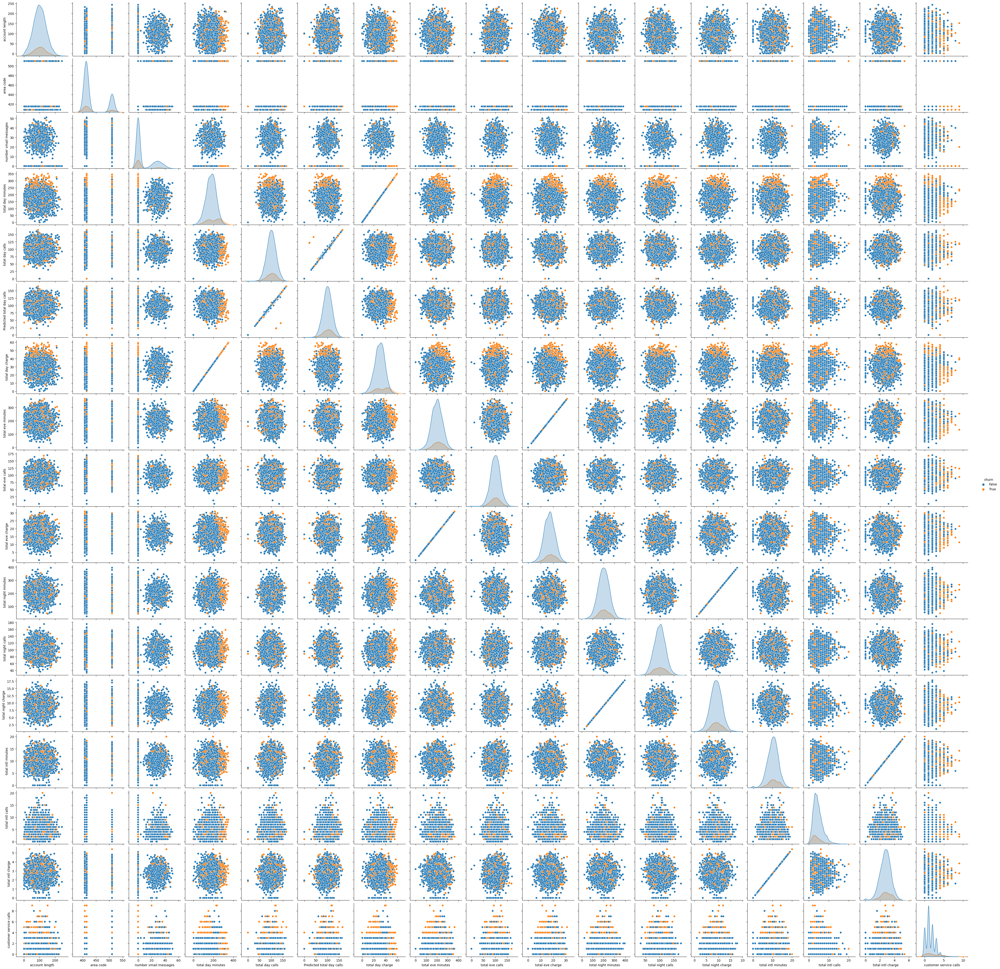

In [18]:
sns.pairplot(df, hue="churn")



   
**Show statistics on non-numerical features.**


In [19]:
df.describe(include=["object", "bool"])

,state,phone number,international plan,voice mail plan,churn
count,3333,3333,3333,3333,3333
unique,51,3333,2,2,2
top,WV,382-4657,no,no,False
freq,106,1,3010,2411,2850




   ** Sort by state and Total day charge .**



In [20]:
df.sort_values(by=['state', 'total day charge'], ascending=False, inplace=True)

 **What are average values of numerical features for churned users?**

In [21]:
df[df['churn'] == 1].mean()

<ipython-input-21-d5c8426bb6af>:1: FutureWarning: The default value of numeric_only in DataFrame.mean is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df[df['churn'] == 1].mean()


account length               102.664596
area code                    437.817805
number vmail messages          5.115942
total day minutes            206.914079
total day calls              101.335404
Predicted total day calls    100.971014
total day charge              35.175921
total eve minutes            212.410145
total eve calls              100.561077
total eve charge              18.054969
total night minutes          205.231677
total night calls            100.399586
total night charge             9.235528
total intl minutes            10.700000
total intl calls               4.163561
total intl charge              2.889545
customer service calls         2.229814
churn                          1.000000
dtype: float64


**How much time (on average) do churned users spend on the phone during daytime?**





In [22]:
average_daytime_minutes = df[df['churn'] == 1]['total day minutes'].mean()
print("Average daytime minutes for churned users:", average_daytime_minutes)


Average daytime minutes for churned users: 206.91407867494823




    
**What is the maximum length of calls among users?**


In [23]:
max_call_length = df['account length'].max()
print("Maximum length of calls among users:", max_call_length)


Maximum length of calls among users: 243


**First five rows in the first three columns**

In [24]:
first_five_rows = df.iloc[:5, :3]
print(first_five_rows)

     state  account length  area code
2874    WY             134        510
730     WY              94        510
1136    WY             106        415
653     WY              87        415
1018    WY              76        415




    
**Show the maximum value to each column.**


In [25]:
df.select_dtypes(include=np.number).apply(np.max)

account length               243.00
area code                    510.00
number vmail messages         51.00
total day minutes            350.80
total day calls              165.00
Predicted total day calls    165.00
total day charge              59.64
total eve minutes            363.70
total eve calls              170.00
total eve charge              30.91
total night minutes          395.00
total night calls            175.00
total night charge            17.77
total intl minutes            20.00
total intl calls              20.00
total intl charge              5.40
customer service calls         9.00
dtype: float64

**Select all states starting with W**

In [26]:
df['state'] = df['state'].fillna('Unknown')
df[df['state'].apply(lambda state: state[0] == 'W')].head()


,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,Predicted total day calls,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
2874,WY,134,510,366-1084,no,no,0,296.0,93,93,...,117,19.24,246.8,98,11.11,12.3,10,3.32,0,True
730,WY,94,510,353-8363,no,no,0,271.2,105,105,...,105,17.22,221.6,51,9.97,11.5,3,3.11,3,True
1136,WY,106,415,338-6018,yes,yes,26,270.3,111,111,...,90,18.29,254.0,133,11.43,14.4,7,3.89,1,True
653,WY,87,415,341-9443,no,yes,22,263.8,65,65,...,115,8.79,208.1,109,9.36,8.5,3,2.30,3,False
1018,WY,76,415,408-6326,no,no,0,263.4,148,148,...,69,19.58,170.6,101,7.68,11.4,5,3.08,1,True


**Draw diagram and show the churn rate with international calls among the telecom operator's customers.**

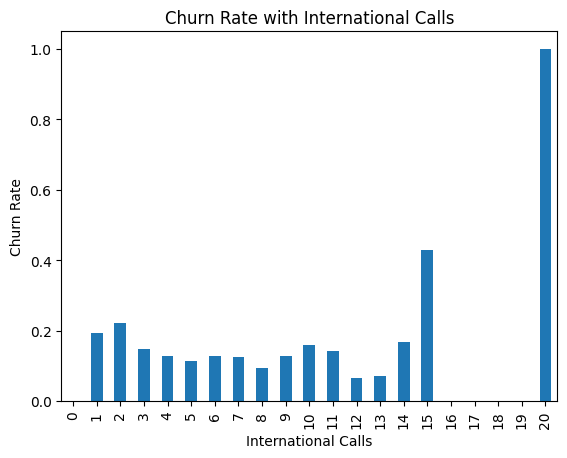

In [27]:
# Calculate churn rate by international calls
churn_rate = df[df['churn'] == 1]['total intl calls'].value_counts() / df['total intl calls'].value_counts()

# Plot the churn rate
churn_rate.plot(kind='bar')

# Set plot labels and title
plt.xlabel('International Calls')
plt.ylabel('Churn Rate')
plt.title('Churn Rate with International Calls')

# Display the plot
plt.show()

**Show Customer service calls. **

In [28]:
df['customer service calls'].describe()

count    3333.000000
mean        1.562856
std         1.315491
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: customer service calls, dtype: float64

Text(0.5, 1.0, 'Distribution of Customer Service Calls')

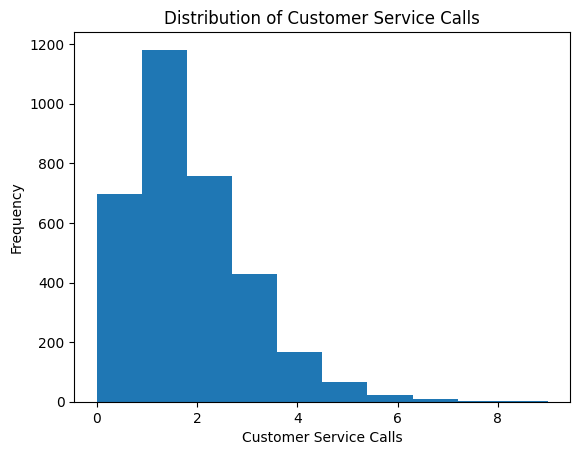

In [29]:
# Visualize the distribution of customer service calls
df['customer service calls'].plot.hist()
plt.xlabel('Customer Service Calls')
plt.ylabel('Frequency')
plt.title('Distribution of Customer Service Calls')



**Show Customer service calls with their churn rate.**

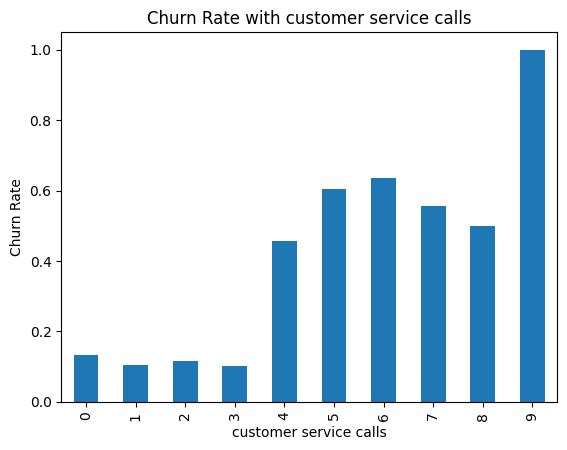

In [30]:
# Calculate churn rate by customer service calls
churn_rate = df[df['churn'] == 1]['customer service calls'].value_counts() / df['customer service calls'].value_counts()

# Plot the churn rate
churn_rate.plot(kind='bar')

# Set plot labels and title
plt.xlabel('customer service calls')
plt.ylabel('Churn Rate')
plt.title('Churn Rate with customer service calls')

# Display the plot
plt.show()


**Show the correlation between the "churn" variable and all other numerical variables in the input Dataframe df**

In [31]:
df.corr()

<ipython-input-31-2f6f6606aa2c>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.corr()


,account length,area code,number vmail messages,total day minutes,total day calls,Predicted total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
account length,1.000000,-0.012463,-0.004628,0.006216,0.038470,0.041465,0.006214,-0.006757,0.019260,-0.006745,-0.008955,-0.013176,-0.008960,0.009514,0.020661,0.009546,-0.003796,0.016541
area code,-0.012463,1.000000,-0.001994,-0.008264,-0.009646,-0.010229,-0.008264,0.003580,-0.011886,0.003607,-0.005825,0.016522,-0.005845,-0.018288,-0.024179,-0.018395,0.027572,0.006174
number vmail messages,-0.004628,-0.001994,1.000000,0.000778,-0.009548,-0.012057,0.000776,0.017562,-0.005864,0.017578,0.007681,0.007123,0.007663,0.002856,0.013957,0.002884,-0.013263,-0.089728
total day minutes,0.006216,-0.008264,0.000778,1.000000,0.006750,0.004539,1.000000,0.007043,0.015769,0.007029,0.004323,0.022972,0.004300,-0.010155,0.008033,-0.010092,-0.013423,0.205151
total day calls,0.038470,-0.009646,-0.009548,0.006750,1.000000,0.988417,0.006753,-0.021451,0.006462,-0.021449,0.022938,-0.019557,0.022927,0.021565,0.004574,0.021666,-0.018942,0.018459
Predicted total day calls,0.041465,-0.010229,-0.012057,0.004539,0.988417,1.000000,0.004542,-0.025754,0.008113,-0.025752,0.024488,-0.017195,0.024477,0.020278,0.005886,0.020370,-0.019958,0.012189
total day charge,0.006214,-0.008264,0.000776,1.000000,0.006753,0.004542,1.000000,0.007050,0.015769,0.007036,0.004324,0.022972,0.004301,-0.010157,0.008032,-0.010094,-0.013427,0.205151
total eve minutes,-0.006757,0.003580,0.017562,0.007043,-0.021451,-0.025754,0.007050,1.000000,-0.011430,1.000000,-0.012584,0.007586,-0.012593,-0.011035,0.002541,-0.011067,-0.012985,0.092796
total eve calls,0.019260,-0.011886,-0.005864,0.015769,0.006462,0.008113,0.015769,-0.011430,1.000000,-0.011423,-0.002093,0.007710,-0.002056,0.008703,0.017434,0.008674,0.002423,0.009233
total eve charge,-0.006745,0.003607,0.017578,0.007029,-0.021449,-0.025752,0.007036,1.000000,-0.011423,1.000000,-0.012592,0.007596,-0.012601,-0.011043,0.002541,-0.011074,-0.012987,0.092786


**What is the proportion of churned users in our Dataframe?**

In [32]:
proportion_churned = df[df['churn'] == 1].count() / df.count()

print("Proportion of churned users: {:.2%}".format(proportion_churned['churn']))



Proportion of churned users: 14.49%


In [33]:
import plotly.express as px
pie = df['churn'].value_counts()
a = pie.index
b = pie.values
fig = px.pie(df, values=b, names=a)
fig.show()
     

The output "Proportion of churned users: 14.49%" means that approximately 14.49% of the users in the DataFrame have churned. The proportion is calculated by dividing the number of churned users by the total number of users in the DataFrame. In this case, the proportion of churned users is 14.49%. This information is valuable because it gives an understanding of the percentage of users who have stopped using or unsubscribed from the telecom.

**Calculate the mean squared error (MSE) as a common way to measure the prediction accuracy between ‘Predicted total day calls’ variable and ‘total day calls’ variable. Explain the output.**

In [34]:
a = np.array(df['Predicted total day calls'])
b = np.array(df['total day calls'])

num_data_points = df.count()[0]  # Number of data points in the DataFrame
error = (1 / num_data_points) * np.sum(np.square(a - b))
error

9.370237023702371




**To explain the output we need**

In [35]:
min_calls = df['total day calls'].min()
max_calls = df['total day calls'].max()
average_calls = np.mean(df['total day calls'])
print("Minimum 'total day calls':",min_calls)
print("Maximum 'total day calls':",max_calls)
print( "Average 'total day calls':",average_calls)


Minimum 'total day calls': 0
Maximum 'total day calls': 165
Average 'total day calls': 100.43564356435644


Based on the range of 'total day calls' values, which goes from 0 to 165, an MSE of 9.370237023702371 can be evaluated as relatively high. The MSE (Mean Squared Error) of 9.370237023702371 represents the average squared difference between the predicted values ('Predicted total day calls') and the actual values ('total day calls'). A higher MSE value suggests that the prediction accuracy is relatively poor, as the squared errors between the predicted and actual values are larger. Considering that the maximum possible value in the range is 165, an MSE of 9.370237023702371 indicates that, on average, the squared difference between the predicted and actual values is around 9.370237023702371. In summary, the result shows a notable level of prediction error, highlighting the potential limitations or room for improvement in the prediction model's accuracy.